In [2]:
# Data analysis
import geopandas as gpd
import numpy as np
import pandas as pd

# APIs
import requests

# Plotting
import seaborn as sns
from matplotlib import pyplot as plt
import holoviews as hv
import hvplot.pandas

In [1]:
pd.options.display.max_columns = 999
pd.options.display.max_colwidth = None

NameError: name 'pd' is not defined

In [3]:
import cenpy

C:\ProgramData\mambaforge\envs\musa-550-fall-2023\lib\site-packages\libpysal\cg\alpha_shapes.py:39: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  def nb_dist(x, y):
C:\ProgramData\mambaforge\envs\musa-550-fall-2023\lib\site-packages\libpysal\cg\alpha_shapes.py:165: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  def get_faces(triangle):
C:\ProgramData\mambaforge\e

# How does the Pandemic change the home and job distribution in the NYC Metro Region? (2019 vs. 2021)
形式：side by side / 年份筛选

**Datasets:**

**1.Population / Housing / Job: ACS-5 year - Shuting**

2.Jobs: BLS QCEW (cjy)

3.Employment: LODES

**Mapping**
1. 2 Maps of population geographical distribution in - 2019 vs. 2022
2. 2 Maps of jobs geographical distribution in - 2019 vs. 2022
3. Housing price geographical distribution (2019 vs. 2021 ACS)
4. Tenure (Rental/Ownership) Rate by County (2019 vs. 2021)

In [4]:
acs21 = cenpy.remote.APIConnection("ACSDT5Y2021")
acs19 = cenpy.remote.APIConnection("ACSDT5Y2019")

In [5]:
variables = [
    "NAME",
    "B01001_001E", # total population
    "B07013_001E", # Total:!!Householder
    "B07013_002E", # Total:!!Householder lived in owner-occupied housing units
    "B07013_003E", # Total:!!Householder lived in renter-occupied housing units
    "B25077_001E", # Median value (dollars)    
]

In [6]:
ny_counties = ['061', '047', '005', '081', '085', '059']

In [7]:
ny_data_21 = []

for county in ny_counties:
    county_data = acs21.query(
        cols=variables,
        geo_unit="tract:*",
        geo_filter={"state": '36', "county": county},
    )
    ny_data_21.append(county_data)

# Adding data for Jersey City
nj_data_21 = acs21.query(
    cols=variables,
    geo_unit="tract:*",
    geo_filter={"state": '34', "county": '017'},
)

ny_data_21.append(nj_data_21)

acsdata21 = pd.concat(ny_data_21, ignore_index=True)

# Rename columns
acsdata21 = acsdata21.rename(columns={
    'B01001_001E': '21 population',
    "B07013_001E": '21 total householder',
    'B07013_002E': '21 owner householder',
    'B07013_003E': '21 renter householder',
    'B25077_001E': '21 median housing value',
})

acsdata21['GEOID'] = acsdata21['state'] + acsdata21['county'] + acsdata21['tract']

acsdata21.head()

,NAME,21 population,21 total householder,21 owner householder,21 renter householder,21 median housing value,state,county,tract,GEOID
0,"Census Tract 1, New York County, New York",0,0,0,0,-666666666,36,061,000100,36061000100
1,"Census Tract 2.01, New York County, New York",2740,2659,0,2659,-666666666,36,061,000201,36061000201
2,"Census Tract 2.02, New York County, New York",6789,6425,1501,4924,667500,36,061,000202,36061000202
3,"Census Tract 5, New York County, New York",0,0,0,0,-666666666,36,061,000500,36061000500
4,"Census Tract 6, New York County, New York",10732,10529,498,10031,776000,36,061,000600,36061000600


In [8]:
ny_data_19 = []

for county in  ny_counties:
    county_data = acs19.query(
        cols=variables,
        geo_unit="tract:*",
        geo_filter={"state": '36', "county": county},
    )
    ny_data_19.append(county_data)

# Adding data for Jersey City
nj_data_19 = acs19.query(
    cols=variables,
    geo_unit="tract:*",
    geo_filter={"state": '34', "county": '017'},
)

ny_data_19.append(nj_data_19)

acsdata19 = pd.concat(ny_data_19, ignore_index=True)
# Rename columns

acsdata19 = acsdata19.rename(columns={
    'B01001_001E': '19 population',
    'B07013_001E': '19 total householder',
    'B07013_002E': '19 owner householder',
    'B07013_003E': '19 renter householder',
    'B25077_001E': '19 median housing value',
})

acsdata19['GEOID'] = acsdata19['state'] + acsdata19['county'] + acsdata19['tract']

acsdata19.head()

,NAME,19 population,19 total householder,19 owner householder,19 renter householder,19 median housing value,state,county,tract,GEOID
0,"Census Tract 255, New York County, New York",5999,5367,104,5263,789300,36,061,025500,36061025500
1,"Census Tract 222, New York County, New York",3369,3198,694,2504,1096400,36,061,022200,36061022200
2,"Census Tract 10.01, New York County, New York",1546,1535,983,552,677800,36,061,001001,36061001001
3,"Census Tract 7, New York County, New York",8501,8452,1997,6455,1403800,36,061,000700,36061000700
4,"Census Tract 103, New York County, New York",2065,2036,190,1846,444700,36,061,010300,36061010300


In [9]:
metro_geojson_path = 'Data_git/Geo/metro.geojson'
metro_gdf = gpd.read_file(metro_geojson_path)
metro_gdf.head()

,GEOID,COUNTYFP,geometry
0,36061001501,061,"POLYGON ((981865.515 198455.903, 981935.654 19..."
1,36061001600,061,"POLYGON ((984941.947 199431.109, 985056.156 19..."
2,36061001800,061,"POLYGON ((985796.223 201370.479, 985808.416 20..."
3,36061002000,061,"POLYGON ((990149.045 201586.466, 990284.254 20..."
4,36061002201,061,"POLYGON ((988552.924 201677.942, 988733.850 20..."


In [10]:
# Calculate the area and convert it to square miles
metro_gdf['area'] = metro_gdf['geometry'].to_crs(epsg=3857).area / 10**6
metro_gdf.head()

,GEOID,COUNTYFP,geometry,area
0,36061001501,061,"POLYGON ((981865.515 198455.903, 981935.654 19...",0.761081
1,36061001600,061,"POLYGON ((984941.947 199431.109, 985056.156 19...",0.361350
2,36061001800,061,"POLYGON ((985796.223 201370.479, 985808.416 20...",0.388537
3,36061002000,061,"POLYGON ((990149.045 201586.466, 990284.254 20...",0.460328
4,36061002201,061,"POLYGON ((988552.924 201677.942, 988733.850 20...",0.281718


In [11]:
acs21_gdf = metro_gdf.merge(acsdata21, on='GEOID', how='inner', suffixes=('_metro', '_acs21'))

acs21_gdf['21 population'] = pd.to_numeric(acs21_gdf['21 population'], errors='coerce')
acs21_gdf['area'] = pd.to_numeric(acs21_gdf['area'], errors='coerce')
acs21_gdf['pop_density'] = acs21_gdf['21 population'] / acs21_gdf['area']

acs21_gdf['21 owner householder'] = pd.to_numeric(acs21_gdf['21 owner householder'], errors='coerce')
acs21_gdf['21 renter householder'] = pd.to_numeric(acs21_gdf['21 renter householder'], errors='coerce')
acs21_gdf['21 total householder'] = pd.to_numeric(acs21_gdf['21 total householder'], errors='coerce')
acs21_gdf['own_rate'] = acs21_gdf['21 owner householder'] / acs21_gdf['21 total householder']
acs21_gdf['rent_rate'] = 1-acs21_gdf['own_rate']

acs21_gdf.head()

,GEOID,COUNTYFP,geometry,area,NAME,21 population,21 total householder,21 owner householder,21 renter householder,21 median housing value,state,county,tract,pop_density,own_rate,rent_rate
0,36061001501,061,"POLYGON ((981865.515 198455.903, 981935.654 19...",0.761081,"Census Tract 15.01, New York County, New York",7749,7290,4254,3036,767300,36,061,001501,10181.574978,0.583539,0.416461
1,36061001600,061,"POLYGON ((984941.947 199431.109, 985056.156 19...",0.361350,"Census Tract 16, New York County, New York",8133,7950,1263,6687,668200,36,061,001600,22507.261055,0.158868,0.841132
2,36061001800,061,"POLYGON ((985796.223 201370.479, 985808.416 20...",0.388537,"Census Tract 18, New York County, New York",7271,6666,635,6031,748100,36,061,001800,18713.780639,0.095260,0.904740
3,36061002000,061,"POLYGON ((990149.045 201586.466, 990284.254 20...",0.460328,"Census Tract 20, New York County, New York",5015,4994,60,4934,-666666666,36,061,002000,10894.415408,0.012014,0.987986
4,36061002201,061,"POLYGON ((988552.924 201677.942, 988733.850 20...",0.281718,"Census Tract 22.01, New York County, New York",6689,6521,847,5674,-666666666,36,061,002201,23743.599946,0.129888,0.870112


In [12]:
acs19_gdf = metro_gdf.merge(acsdata19, on='GEOID', how='inner', suffixes=('_metro', '_acs19'))

acs19_gdf['19 population'] = pd.to_numeric(acs19_gdf['19 population'], errors='coerce')
acs19_gdf['area'] = pd.to_numeric(acs19_gdf['area'], errors='coerce')
acs19_gdf['pop_density'] = acs19_gdf['19 population'] / acs19_gdf['area']

acs19_gdf['19 owner householder'] = pd.to_numeric(acs19_gdf['19 owner householder'], errors='coerce')
acs19_gdf['19 renter householder'] = pd.to_numeric(acs19_gdf['19 renter householder'], errors='coerce')
acs19_gdf['19 total householder'] = pd.to_numeric(acs19_gdf['19 total householder'], errors='coerce')
acs19_gdf['own_rate'] = acs19_gdf['19 owner householder'] / acs19_gdf['19 total householder']
acs19_gdf['rent_rate'] = 1-acs19_gdf['own_rate']

acs19_gdf.head()

,GEOID,COUNTYFP,geometry,area,NAME,19 population,19 total householder,19 owner householder,19 renter householder,19 median housing value,state,county,tract,pop_density,own_rate,rent_rate
0,36061001501,061,"POLYGON ((981865.515 198455.903, 981935.654 19...",0.761081,"Census Tract 15.01, New York County, New York",7398,6833,3607,3226,800100,36,061,001501,9720.388655,0.527879,0.472121
1,36061001600,061,"POLYGON ((984941.947 199431.109, 985056.156 19...",0.361350,"Census Tract 16, New York County, New York",6968,6844,393,6451,1200000,36,061,001600,19283.240506,0.057423,0.942577
2,36061001800,061,"POLYGON ((985796.223 201370.479, 985808.416 20...",0.388537,"Census Tract 18, New York County, New York",6788,6116,322,5794,794100,36,061,001800,17470.656440,0.052649,0.947351
3,36061002000,061,"POLYGON ((990149.045 201586.466, 990284.254 20...",0.460328,"Census Tract 20, New York County, New York",4586,4542,34,4508,-666666666,36,061,002000,9962.470401,0.007486,0.992514
4,36061002201,061,"POLYGON ((988552.924 201677.942, 988733.850 20...",0.281718,"Census Tract 22.01, New York County, New York",6565,6392,693,5699,236700,36,061,002201,23303.443511,0.108417,0.891583


In [13]:
metro_geojson_path = 'Data_git/Geo/Borough Boundaries.geojson'
metro_counties_gdf = gpd.read_file(metro_geojson_path)
metro_counties_gdf

,boro_code,boro_name,shape_area,shape_leng,geometry
0,5,Staten Island,1623620725.05,325917.35395,"MULTIPOLYGON (((-74.05051 40.56642, -74.05047 ..."
1,2,Bronx,1187174784.85,463179.772813,"MULTIPOLYGON (((-73.89681 40.79581, -73.89694 ..."
2,4,Queens,3041418505.55,888199.730955,"MULTIPOLYGON (((-73.82645 40.59053, -73.82642 ..."
3,1,Manhattan,636520502.801,357713.30866,"MULTIPOLYGON (((-74.01093 40.68449, -74.01193 ..."
4,3,Brooklyn,1934138258.43,728148.53241,"MULTIPOLYGON (((-73.86327 40.58388, -73.86381 ..."


In [14]:
counties_shape_gdf = gpd.read_file('Data_git/Geo/counties_shape_gdf.geojson')

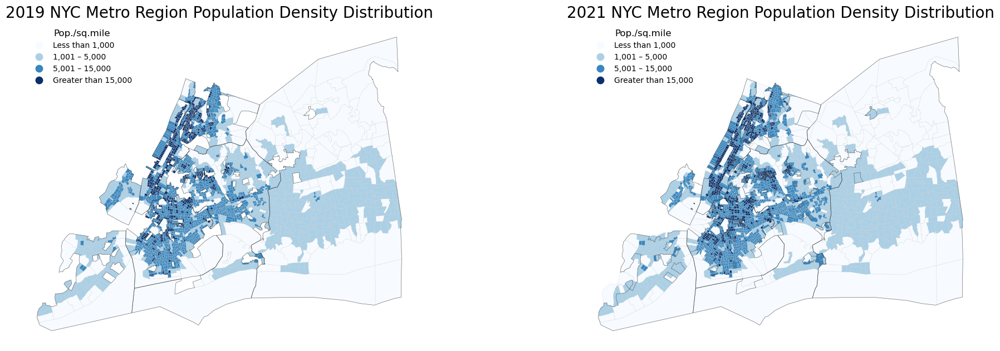

In [16]:
#metro_region_counties_gdf = metro_region_counties_gdf.to_crs(epsg=2263)

# Create subplots with adjusted aspect ratio and space between plots# Define bins and labels for population density categories
bins = [0, 1000, 5000, 15000, np.inf]
labels = ['< 1,000', '1,001 – 5,000', '5,001 – 15,000', '> 15,000']

# Create 'pop_density_category' column for 2019
acs19_gdf['pop_density_category'] = pd.cut(acs19_gdf['pop_density'], bins=bins, labels=labels, right=False)

# Create 'pop_density_category' column for 2021
acs21_gdf['pop_density_category'] = pd.cut(acs21_gdf['pop_density'], bins=bins, labels=labels, right=False)

# Create subplots with equal aspect ratio
fig, axes = plt.subplots(1, 2, figsize=(18, 8))

# Plot for 2019
plot19 = acs19_gdf.plot(column='pop_density_category', cmap='Blues', linewidth=0.2, ax=axes[0], edgecolor='0.8', legend=True)

#Add county boundaries to the map
counties_shape_gdf .plot(ax=axes[0], edgecolor='black', linewidth=0.5, alpha=0.5,facecolor='none')

# Customize the legend for 2019
legend_labels_19 = {'< 1,000': 'Less than 1,000', '1,001 – 5,000': '1,001 – 5,000', '5,001 – 15,000': '5,001 – 15,000', '> 15,000': 'Greater than 15,000'}
legend_19 = plot19.get_legend()
legend_19.set_title('Pop./sq.mile', prop={'size': 12})  # Add a title to the legend
for label, description in legend_labels_19.items():
    legend_19.get_texts()[labels.index(label)].set_text(description)

axes[0].set_title('2019 NYC Metro Region Population Density Distribution', fontdict={'fontsize': '20', 'fontweight': '3'})
axes[0].set_axis_off()


# Plot for 2021
plot21 = acs21_gdf.plot(column='pop_density_category', cmap='Blues', linewidth=0.2, ax=axes[1], edgecolor='0.8', legend=True)

#Add county boundaries to the map
counties_shape_gdf .plot(ax=axes[1], edgecolor='black', linewidth=0.5, alpha=0.5,facecolor='none')

# Customize the legend for 2021
legend_labels_21 = {'< 1,000': 'Less than 1,000', '1,001 – 5,000': '1,001 – 5,000', '5,001 – 15,000': '5,001 – 15,000', '> 15,000': 'Greater than 15,000'}
legend_21 = plot21.get_legend()
legend_21.set_title('Pop./sq.mile', prop={'size': 12})  # Add a title to the legend
for label, description in legend_labels_21.items():
    legend_21.get_texts()[labels.index(label)].set_text(description)

axes[1].set_title('2021 NYC Metro Region Population Density Distribution', fontdict={'fontsize': '20', 'fontweight': '3'})
axes[1].set_axis_off()

# Adjust layout with larger central map and space between plots
plt.subplots_adjust(left=0.02, right=0.98, wspace=0.4)

# Move legend to upper left for both plots
for ax in axes:
    legend = ax.get_legend()
    legend.set_bbox_to_anchor((0.3, 1))
    legend.get_frame().set_linewidth(0)  # Remove legend box boundaries
    legend.get_frame().set_alpha(0)  # Make legend background transparent
    
# Show the plot
plt.show()


In [17]:
# Convert '19 median housing value' and '21 median housing value' to numeric columns
acs19_gdf['19 median housing value'] = pd.to_numeric(acs19_gdf['19 median housing value'], errors='coerce')
acs21_gdf['21 median housing value'] = pd.to_numeric(acs21_gdf['21 median housing value'], errors='coerce')

# Define bins and labels for housing value categories
bins = [0, 500000, 650000, 800000, np.inf]
labels = ['< $500,000', '$500,000 – $650,000', '$650,000 – $800,000', '> $800,000']

# Create 'housing_value_category' column for 2019
acs19_gdf['housing_value_category'] = pd.cut(acs19_gdf['19 median housing value'], bins=bins, labels=labels, right=False)

# Create 'housing_value_category' column for 2021
acs21_gdf['housing_value_category'] = pd.cut(acs21_gdf['21 median housing value'], bins=bins, labels=labels, right=False)

# Convert 'housing_value_category' column values to strings
acs19_gdf['housing_value_category'] = acs19_gdf['housing_value_category'].astype(str)
acs21_gdf['housing_value_category'] = acs21_gdf['housing_value_category'].astype(str)

# Convert 'housing_value_category' column values to numeric
acs19_gdf['housing_value_category'] = pd.Categorical(acs19_gdf['housing_value_category'], categories=labels, ordered=True).codes
acs21_gdf['housing_value_category'] = pd.Categorical(acs21_gdf['housing_value_category'], categories=labels, ordered=True).codes

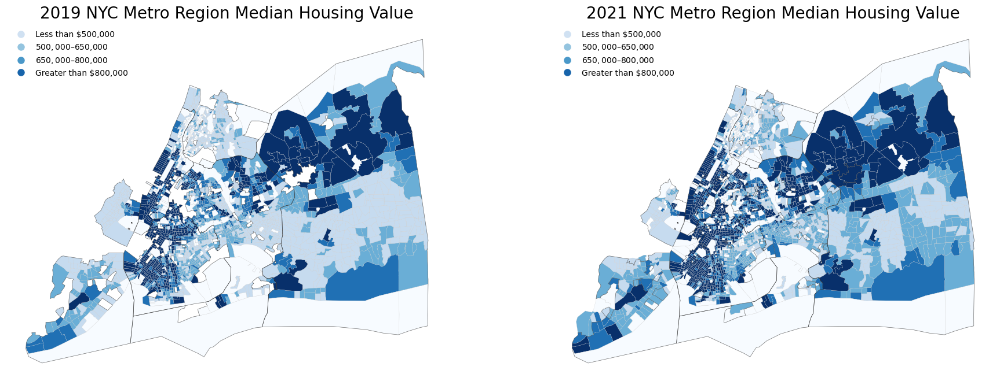

In [18]:
import matplotlib.patches as mpatches
import matplotlib.lines as mlines

# Create subplots with equal aspect ratio
fig, axes = plt.subplots(1, 2, figsize=(18, 8))

# Plot for 2019
plot19 = acs19_gdf.plot(column='housing_value_category', cmap='Blues', linewidth=0.2, ax=axes[0], edgecolor='0.8', legend=False)

# Add county boundaries to the map
counties_shape_gdf.plot(ax=axes[0], edgecolor='black', linewidth=0.5, alpha=0.5, facecolor='none')

# Customize the legend for 2021
legend_labels_19 = {'< $500,000': 'Less than $500,000', '$500,000 – $650,000': '$500,000 – $650,000', '$650,000 – $800,000': '$650,000 – $800,000', '> $800,000': 'Greater than $800,000'}

# Add legend for 2019
handles_19 = [mlines.Line2D([0], [0], marker='o', color='w', markerfacecolor=color, markersize=10, label=label) for label, color in zip(legend_labels_19.values(), sns.color_palette('Blues', len(legend_labels_19)))]
legend_19 = axes[0].legend(handles=handles_19, loc='upper left', bbox_to_anchor=(0, 1), frameon=False)

axes[0].set_title('2019 NYC Metro Region Median Housing Value', fontdict={'fontsize': '20', 'fontweight': '3'})
axes[0].set_axis_off()

# Plot for 2021
plot21 = acs21_gdf.plot(column='housing_value_category', cmap='Blues', linewidth=0.2, ax=axes[1], edgecolor='0.8', legend=False)

# Add county boundaries to the map
counties_shape_gdf.plot(ax=axes[1], edgecolor='black', linewidth=0.5, alpha=0.5, facecolor='none')

# Customize the legend for 2021
legend_labels_21 = {'< $500,000': 'Less than $500,000', '$500,000 – $650,000': '$500,000 – $650,000', '$650,000 – $800,000': '$650,000 – $800,000', '> $800,000': 'Greater than $800,000'}

# Add legend for 2021
handles_21 = [mlines.Line2D([0], [0], marker='o', color='w', markerfacecolor=color, markersize=10, label=label) for label, color in zip(legend_labels_21.values(), sns.color_palette('Blues', len(legend_labels_21)))]
legend_21 = axes[1].legend(handles=handles_21, loc='upper left', bbox_to_anchor=(0, 1), frameon=False)

axes[1].set_title('2021 NYC Metro Region Median Housing Value', fontdict={'fontsize': '20', 'fontweight': '3'})
axes[1].set_axis_off()

# Adjust layout with larger central map and space between plots
plt.subplots_adjust(left=0.02, right=0.98, wspace=0.2)

# Show the plot
plt.show()

In [20]:
acs19_gdf_own_rate = acs19_gdf[['NAME', 'own_rate', '19 median housing value','geometry']].copy()
acs19_gdf_own_rate.head()

,NAME,own_rate,19 median housing value,geometry
0,"Census Tract 15.01, New York County, New York",0.527879,800100,"POLYGON ((981865.515 198455.903, 981935.654 19..."
1,"Census Tract 16, New York County, New York",0.057423,1200000,"POLYGON ((984941.947 199431.109, 985056.156 19..."
2,"Census Tract 18, New York County, New York",0.052649,794100,"POLYGON ((985796.223 201370.479, 985808.416 20..."
3,"Census Tract 20, New York County, New York",0.007486,-666666666,"POLYGON ((990149.045 201586.466, 990284.254 20..."
4,"Census Tract 22.01, New York County, New York",0.108417,236700,"POLYGON ((988552.924 201677.942, 988733.850 20..."


In [21]:
acs21_gdf_own_rate = acs21_gdf[['NAME', 'own_rate', '21 median housing value','geometry']].copy()
acs21_gdf_own_rate.head()

,NAME,own_rate,21 median housing value,geometry
0,"Census Tract 15.01, New York County, New York",0.583539,767300,"POLYGON ((981865.515 198455.903, 981935.654 19..."
1,"Census Tract 16, New York County, New York",0.158868,668200,"POLYGON ((984941.947 199431.109, 985056.156 19..."
2,"Census Tract 18, New York County, New York",0.095260,748100,"POLYGON ((985796.223 201370.479, 985808.416 20..."
3,"Census Tract 20, New York County, New York",0.012014,-666666666,"POLYGON ((990149.045 201586.466, 990284.254 20..."
4,"Census Tract 22.01, New York County, New York",0.129888,-666666666,"POLYGON ((988552.924 201677.942, 988733.850 20..."


In [26]:
import folium

# Create a Folium map centered around the mean of the geometry
m = acs21_gdf_own_rate.explore(
    column="own_rate",  # Specify the value column
    cmap="coolwarm",  # Use coolwarm colormap
    tiles="CartoDB positron",  # Specify basemap tiles
    vmin=0,  # Set the minimum value for the colormap
    vmax=1,   # Set the maximum value for the colormap
)

# Add a title
title_html = '<h3 align="center" style="font-size:20px"><b>2021 NYC Metro Region Housing Ownership Rate</b></h3>'
m.get_root().html.add_child(folium.Element(title_html))

# Show the map
m

In [27]:
# Create a Folium map centered around the mean of the geometry
m = acs19_gdf_own_rate.explore(
    column="own_rate",  # Specify the value column
    cmap="coolwarm",  # Use coolwarm colormap
    tiles="CartoDB positron",  # Specify basemap tiles
    vmin=0,  # Set the minimum value for the colormap
    vmax=1,   # Set the maximum value for the colormap
)

# Add a title
title_html = '<h3 align="center" style="font-size:20px"><b>2019 NYC Metro Region Housing Ownership Rate</b></h3>'
m.get_root().html.add_child(folium.Element(title_html))

# Show the map
m